# **Instance Segmentation with YOLO11 Using the BDD100K Dataset**

In this notebook, I fine-tune the [YOLO11-seg](https://docs.ultralytics.com/tasks/segment/) model from [Ultralytics], the latest and most advanced model in the YOLO series for real-time instance segmentation. The YOLO11-seg models have been pretrained on the [COCO](https://docs.ultralytics.com/datasets/detect/coco/#coco-pretrained-models) dataset, which consists of 200,000 images and 80 object categories, providing a strong foundation for general instance segmentation tasks.

In this case, I specifically fine-tune the `YOLO11m-seg` model using the [BDD100K](https://github.com/bdd100k/bdd100k/) dataset, the largest open video dataset for autonomous driving. This dataset offers geographical, environmental, and meteorological diversity, with dynamic outdoor scenes captured at different times of the day. Moreover, the complex movement of autonomous vehicles especially challenges perception tasks. For instance segmentation, the raw dataset is divided into three parts: 7000 images for training, 1000 for validation, and 2000 for testing (not publicly available), using the same 8 classes defined for instance segmentation in the [Cityscapes](https://www.cityscapes-dataset.com/dataset-overview/) dataset.

## **Imports**

In [1]:
# Installation of the Ultralytics library
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.2/949.2 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 59.0 MB/s eta 0:00:00


In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from google.colab import drive
from glob import glob
from IPython.display import clear_output, display, Video
import cv2
import os

# Necessary in Colab with Ultralytics to prevent path-related encoding errors
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [2]:
# Mount Google Drive in Colab
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


## **Parameters**

In [3]:
model_name = "yolo11m-seg.pt"
zip_dataset_path = "/content/drive/MyDrive/Datasets/BDD100K.zip"
dataset_dir = os.path.basename(zip_dataset_path).split(".")[0]
project_dir = "/content/drive/MyDrive/Ultralytics"
project_name = os.path.join(project_dir, "InstanceSegmentation_YOLO11m_BDD100K")
batch_size = 8
epochs = 30
patience = 7
imgsz = 1024

## **Load the Dataset**

The download, along with all the preprocessing and analysis of the BDD100K, has been completed in the following notebook: [Preprocessing_BDD100K](https://github.com/JersonGB22/ImageSegmentation-TensorFlow-PyTorch/blob/main/Preprocessing/Preprocessing_BDD100K.ipynb).

In [ ]:
!unzip -q $zip_dataset_path

## **Training and Evaluation of the Model**

The **YOLO11m-seg** model, downloaded from Ultralytics' GitHub repository, is based on **PyTorch**, which prevents it from being trained on **Google Colab's TPU** to speed up the process.  

One of the advantages of **Ultralytics** is that there is no need to manually specify the optimizer or learning rate, as these parameters are automatically adjusted based on the dataset size and the number of epochs. However, in this case, the best results were obtained experimentally using an **initial learning rate** of `1e-4` and a **final learning rate** of `1e-6`, along with an image size of **1024**. With this configuration, the model converges in just **30 epochs**, achieving optimal performance in the shortest possible time. This is particularly important since training with the **BDD100K** dataset requires significant time when using **Google Colab’s** free GPU. Experiments with a higher number of epochs were also conducted, but the model did not improve its generalization performance on the validation set and, in some cases, even produced worse results.  

Finally, since training **YOLO** models can be a time-consuming process, **Ultralytics** provides an option to resume training from the last checkpoint. This feature is especially useful in case of interruptions or when exceeding the free usage limit of **Google Colab’s GPU**, which has a maximum runtime of **4 hours and 10 minutes**. In total, fine-tuning the model takes approximately **7 hours and 30 minutes**.

Regarding data augmentation to make the model more robust and prevent overfitting, with Ultralytics, it is simply a matter of adjusting the values of each transformation since everything is implemented with the [Albumentations](https://albumentations.ai/), [OpenCV](https://opencv.org/) and [Torchvision](https://pytorch.org/vision/stable/index.html) libraries.

During training, the **YOLO-seg** model uses the following four loss functions::

- **box_loss**: This is the **Complete Intersection over Union (CIoU) Loss**. This loss function considers not only the overlap between the predicted and actual bounding boxes but also the distance between their centers and the aspect ratio. This makes it a more thorough metric for assessing box alignment. It surpasses the performance of IoU (Intersection over Union), GIoU (Generalized IoU), and DIoU (Distance IoU) losses.

- **seg_loss**: This loss function evaluates the accuracy of instance segmentation. The predicted masks are obtained by combining mask coefficients with prototypes, while the ground truth masks are generated from the coordinates of the contours or polygons of the instances, which are then converted into binary masks. The comparison is performed by applying **Binary Cross-Entropy with Logits** on a pixel-by-pixel basis to the masks cropped according to each instance’s bounding box, with the loss normalized by dividing by the corresponding area. This formulation ensures a precise measurement of segmentation errors in delineating object boundaries and separating overlapping instances, preventing errors on small objects from having an excessive impact.

- **cls_loss**: This is the **Binary Cross-Entropy loss with logits** applied to the model's classifier.

- **dfl_loss**: This refers to the **Distribution Focal Loss (DFL)**, an enhanced variant of the focal loss aimed at giving greater emphasis to difficult-to-classify instances. It modifies the focal loss according to the class distribution, enhancing the model's sensitivity to minority classes and helping to address class imbalance.

In [ ]:
pretrained = True
if pretrained:
  model = YOLO(os.path.join(project_name, "weights/last.pt"))
else:
  model = YOLO(model_name)

model.info()

YOLO11m-seg summary: 253 layers, 22,365,384 parameters, 0 gradients, 123.6 GFLOPs


(253, 22365384, 0, 123.61016320000002)

In [ ]:
if pretrained:
  results = model.train(resume=True)

else:
  results = model.train(
      data=os.path.join(dataset_dir, "data.yaml"),
      epochs=epochs,
      patience=patience,
      batch=batch_size,
      optimizer="AdamW",
      lr0=1e-4,
      lrf=1e-2, #final_learning_rate = lr0 * lrf
      momentum=0.9,
      imgsz=imgsz,
      deterministic=True, #Allows for reproducibility of the training
      verbose=True, #Enables model evaluation on the validation dataset immediately after training
      project=project_dir,
      name=project_name,

      # Data Augmentation
      hsv_h=0.015, #Randomly adjusts the hue of the image within the range [1-0.015; 1+0.015]
      hsv_s=0.2, #Randomly adjusts the saturation of the image within the range [1-0.2; 1+0.2]
      hsv_v=0.3, #Randomly adjusts the brightness of the image within the range [1-0.3; 1+0.3]
      translate=0.1, #Randomly shifts the image horizontally and vertically by up to 10% of its original size
      scale=0.25, #Randomly scales the image size within the range of [100%-25%; 100%+25%]
      fliplr=0.5, #Horizontal flip of the image with a probability of 0.5
      mosaic=1.0, #Combines 4 images into one with a probability of 1
      close_mosaic=0, #Allows applying the mosaic in all epochs
      erasing=0.25 #25% probability of applying random erasure using 'torchvision.transforms.RandomErasing'
  )

Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=/content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/weights/last.pt, data=BDD100K/data.yaml, epochs=30, time=None, patience=7, batch=8, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Ultralytics, name=InstanceSegmentation_YOLO11m_BDD100K, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=/content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=Fal

100%|██████████| 755k/755k [00:00<00:00, 35.1MB/s]


TensorBoard: Start with 'tensorboard --logdir /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.

100%|██████████| 5.35M/5.35M [00:00<00:00, 156MB/s]


AMP: checks passed ✅


train: Scanning /content/BDD100K/train/labels... 6887 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6887/6887 [00:08<00:00, 815.48it/s] 


train: New cache created: /content/BDD100K/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/BDD100K/val/labels... 980 images, 0 backgrounds, 0 corrupt: 100%|██████████| 980/980 [00:03<00:00, 278.72it/s]


val: New cache created: /content/BDD100K/val/labels.cache
Plotting labels to /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 115 weight(decay=0.0), 126 weight(decay=0.0005), 125 bias(decay=0.0)
Resuming training /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/weights/last.pt from epoch 16 to 30 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      13.4G     0.8408      1.778     0.6025     0.9394         97       1024: 100%|██████████| 861/861 [14:33<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:32<00:00,  1.89it/s]


                   all        980      12948      0.576      0.475      0.506      0.347      0.716      0.414      0.448      0.256

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      12.4G     0.8314      1.739     0.5936     0.9333        129       1024: 100%|██████████| 861/861 [14:38<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:32<00:00,  1.89it/s]


                   all        980      12948      0.611      0.463      0.511      0.346      0.567      0.421      0.446      0.255

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      13.1G     0.8217      1.701     0.5763     0.9293        127       1024: 100%|██████████| 861/861 [14:40<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:32<00:00,  1.92it/s]


                   all        980      12948       0.66      0.456      0.525      0.352      0.628      0.424      0.458      0.265

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      13.1G     0.8126      1.676     0.5628     0.9238        109       1024: 100%|██████████| 861/861 [14:43<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:32<00:00,  1.90it/s]


                   all        980      12948      0.765      0.441      0.504      0.347      0.542      0.468      0.454      0.262

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      13.2G     0.8081      1.666     0.5571     0.9213        191       1024: 100%|██████████| 861/861 [14:43<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.96it/s]


                   all        980      12948      0.653      0.447      0.508      0.346       0.62      0.416      0.455      0.259

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      13.3G     0.7991      1.632     0.5473      0.917        206       1024: 100%|██████████| 861/861 [14:41<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.95it/s]


                   all        980      12948      0.611      0.467      0.507      0.348      0.579      0.442      0.462      0.264

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      12.8G     0.7945      1.601     0.5427     0.9147        189       1024: 100%|██████████| 861/861 [14:44<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.97it/s]


                   all        980      12948      0.612      0.478        0.5      0.339      0.587      0.455      0.456      0.254

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      12.6G     0.7883      1.591     0.5366     0.9135        133       1024: 100%|██████████| 861/861 [14:43<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:32<00:00,  1.90it/s]


                   all        980      12948      0.653      0.457      0.513      0.342      0.645      0.421      0.445      0.245

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      13.3G     0.7776      1.566     0.5274     0.9093        212       1024: 100%|██████████| 861/861 [14:42<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.97it/s]


                   all        980      12948       0.62      0.474      0.515      0.355      0.686      0.425      0.464      0.266

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      12.7G     0.7775      1.556       0.52     0.9096        117       1024: 100%|██████████| 861/861 [14:40<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.97it/s]


                   all        980      12948      0.643      0.463      0.519      0.349      0.635      0.409      0.456      0.262

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      12.6G     0.7676      1.528     0.5118     0.9057        158       1024: 100%|██████████| 861/861 [14:37<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.97it/s]


                   all        980      12948      0.647       0.46      0.511      0.347      0.556      0.454      0.456      0.259

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      12.8G     0.7674      1.537     0.5089     0.9056        188       1024: 100%|██████████| 861/861 [14:35<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:32<00:00,  1.92it/s]


                   all        980      12948      0.622      0.466      0.508      0.348      0.617      0.459      0.464      0.265

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      12.7G     0.7618      1.519     0.5037     0.9036        114       1024: 100%|██████████| 861/861 [14:40<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.98it/s]


                   all        980      12948      0.636      0.462      0.508      0.349      0.645      0.436      0.469      0.264

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      13.2G     0.7572      1.494     0.4986     0.9012        171       1024: 100%|██████████| 861/861 [14:29<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.99it/s]


                   all        980      12948      0.662      0.459      0.513       0.35      0.648      0.445      0.463      0.265

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      12.6G     0.7552      1.492     0.4946     0.9001        147       1024: 100%|██████████| 861/861 [14:29<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:31<00:00,  1.95it/s]


                   all        980      12948      0.664      0.467      0.517      0.351      0.669      0.436      0.461      0.264

15 epochs completed in 3.809 hours.
Optimizer stripped from /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/weights/last.pt, 45.2MB
Optimizer stripped from /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/weights/best.pt, 45.2MB

Validating /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11m_BDD100K/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m-seg summary (fused): 138 layers, 22,341,480 parameters, 0 gradients, 123.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:35<00:00,  1.75it/s]


                   all        980      12948      0.623      0.474      0.516      0.355      0.686      0.425      0.464      0.266
               bicycle         46         99      0.649      0.414      0.416      0.206       0.69      0.359      0.352      0.145
                   bus        136        219      0.638      0.489      0.538      0.422      0.711      0.449      0.515      0.365
                   car        973      10833      0.799      0.751      0.813      0.603      0.815      0.653      0.739      0.446
            motorcycle         43         47      0.819      0.511       0.58      0.392      0.777      0.445      0.492      0.304
                person        381       1177      0.796      0.655      0.733      0.469      0.835      0.571      0.685      0.368
                 rider         39         45      0.686      0.489      0.522       0.33      0.696      0.356      0.365      0.152
                 train          7          7          0          0   

Upon completing the training, Ultralytics automatically evaluates the model's performance on the validation dataset, generating performance metrics and their corresponding graphs. The metrics for instance segmentation are as follows:

- **Precision:** This metric measures the proportion of correct predictions among all predictions made by the model. It is calculated as the number of true positives (TP) divided by the sum of true positives and false positives (FP).

  - **True Positives (TP):** A true positive is counted when the predicted bounding box or segmentation mask has an Intersection over Union (IoU) of at least 0.5 with the ground truth box or mask and belongs to the same class. This means the model has not only correctly detected the presence of an object but has also accurately identified its location, contour, and category.
  
  - **False Positives (FP):** A false positive occurs when the model predicts the presence of an object (i.e., generates a bounding box or segmentation mask), but no corresponding object actually exists in the image, or the detected or segmented object does not belong to the correct class.

  - **False Negatives (FN):** A false negative occurs when the model fails to detect an object that is present in the image. In other words, a real object exists, but the model does not generate any corresponding prediction for it.

- **Recall:** This metric measures the proportion of correctly detected or segmented objects relative to the total number of objects actually present in the image. It is calculated by dividing the number of true positives by the sum of true positives and false negatives.

- **mAP50:** The mean Average Precision at an IoU threshold of 0.5, where Average Precision (AP) is calculated as the area under the precision-recall curve. This metric offers an overall evaluation of the model's ability to detect or segment objects accurately, by averaging precision across various classes, with the IoU threshold fixed at 0.5. It is a standard metric used in the evaluation of the COCO dataset.

- **mAP50-95:** The mean Average Precision across multiple IoU thresholds ranging from 0.5 to 0.95, incremented by 0.05. This metric provides a more comprehensive evaluation of the model's performance, accounting for varying levels of object localization or segmentation precision. Like mAP50, this metric is also used in COCO evaluations, enabling standardized comparisons across different models.

All these metrics range from **0** to **1**, where a value of **0** signifies poor performance (no correct predictions), and a value of **1** represents perfect performance (all predictions are correct).

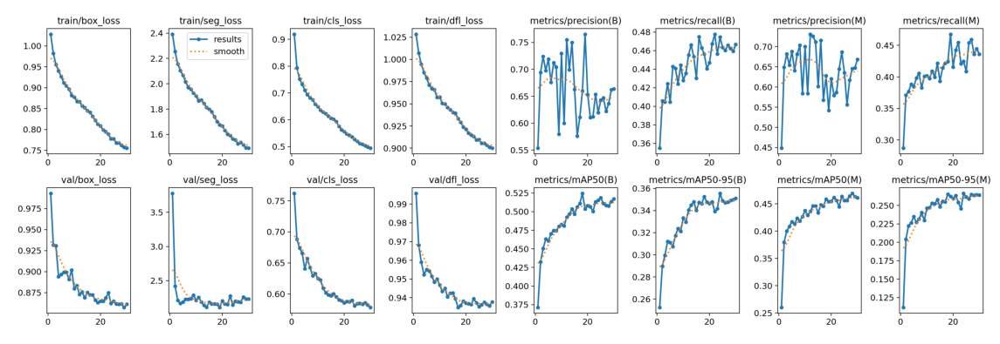

In [ ]:
# Loss and Metrics Graphs
plt.figure(figsize=(12, 8))

img = Image.open(os.path.join(project_name, "results.png"))
plt.imshow(img)
plt.tight_layout()
plt.axis("off");

## **Inference with the Trained Model**

Inference with a fine-tuned Ultralytics YOLO model is straightforward, as it accepts a wide range of image and video formats for predictions. Additionally, the results are presented graphically and can be obtained in real time. All accepted formats are detailed in the official [Ultralytics documentation](https://docs.ultralytics.com/modes/predict/#inference-sources).

In [4]:
# Load the trained model
model = YOLO(os.path.join(project_name, "weights/best.pt"))

In [ ]:
# Function for image inference
def instance_segmentation(images, n_rows=2, n_cols=1, random=True, font_size=20, save=False, path_save=""):
  n_samples = int(n_rows * n_cols)
  if random:
    sample_images = np.random.choice(images, n_samples, replace=False).tolist()
  else:
    sample_images = images[:n_samples]

  results = model.predict(
      source=sample_images,
      imgsz=imgsz,
      save=False,
      verbose=False
  )

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 9.6, n_rows * 4.8))
  axes = axes.flatten() if n_samples > 1 else [axes]

  for i, result in enumerate(results):
    result = result.plot(line_width=2, font_size=font_size, pil=True)
    result = np.array(result)[..., ::-1] #Convert the image to RGB format
    axes[i].imshow(result)
    axes[i].axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

### **Validation Dataset**

In [ ]:
val_image_paths = glob(os.path.join(dataset_dir, "val/images/*.jpg"))

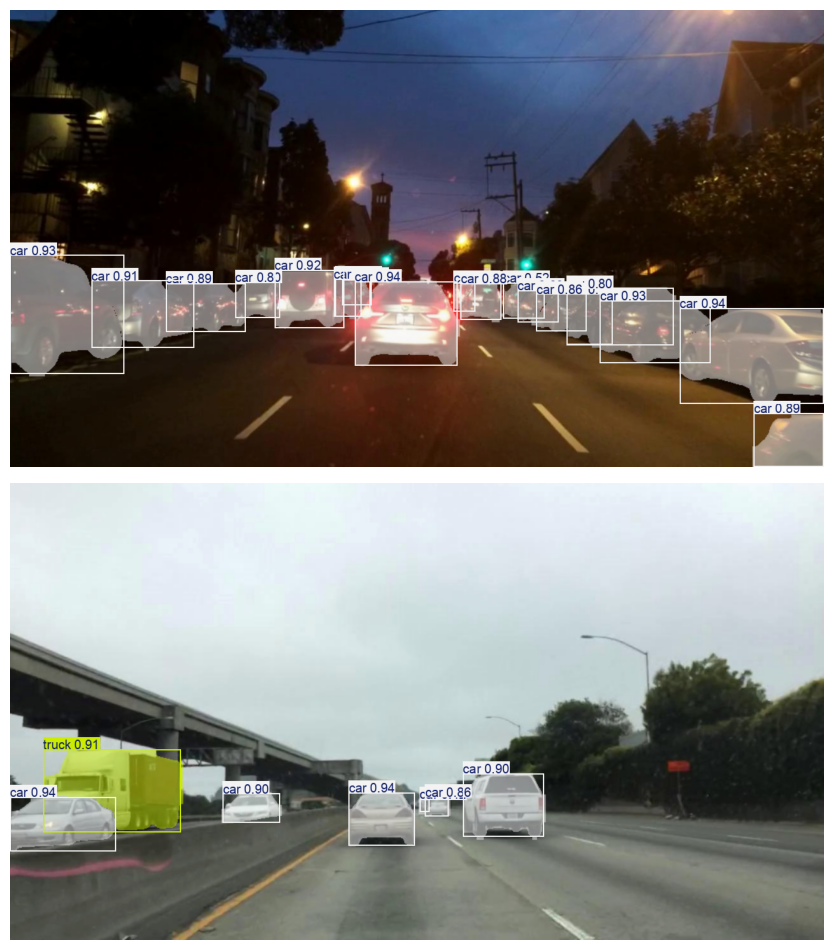

In [ ]:
instance_segmentation(val_image_paths)

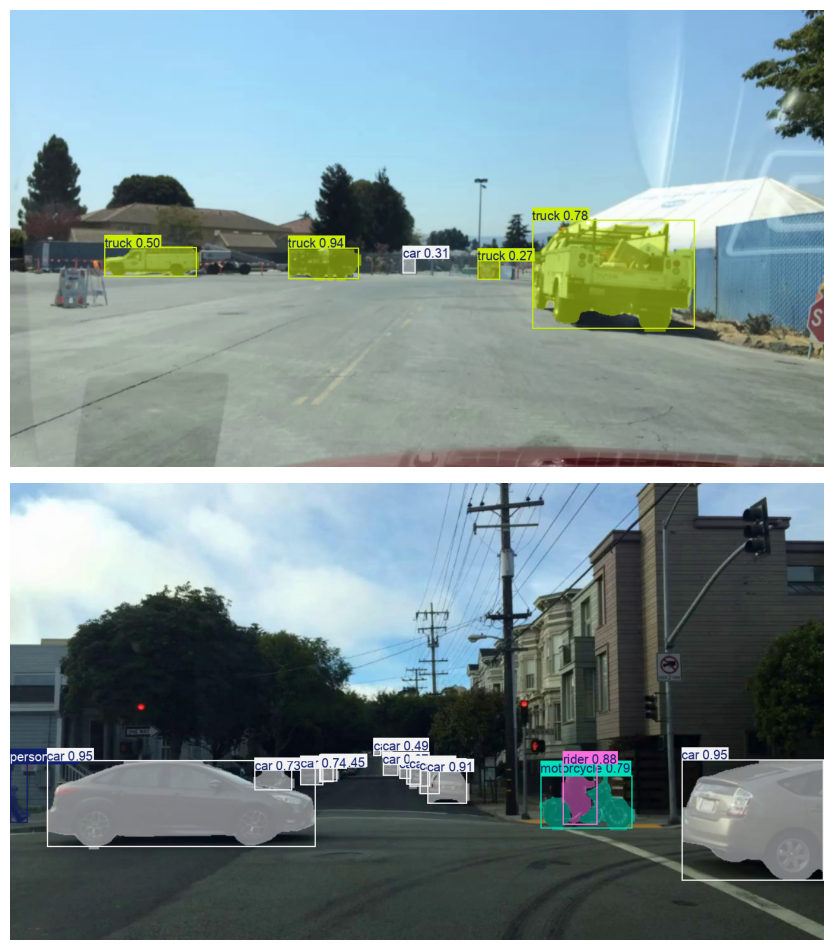

In [ ]:
instance_segmentation(val_image_paths)

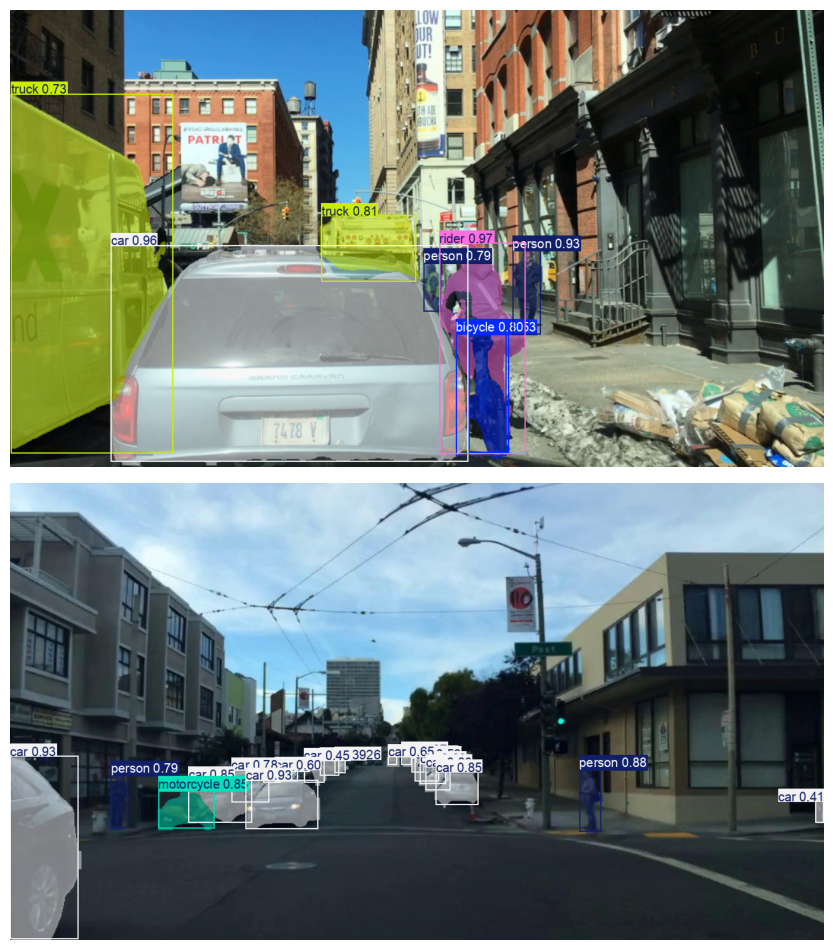

In [ ]:
instance_segmentation(val_image_paths, save=True, path_save="InstanceSegmentation_YOLO11m_BDD100K_1.png")

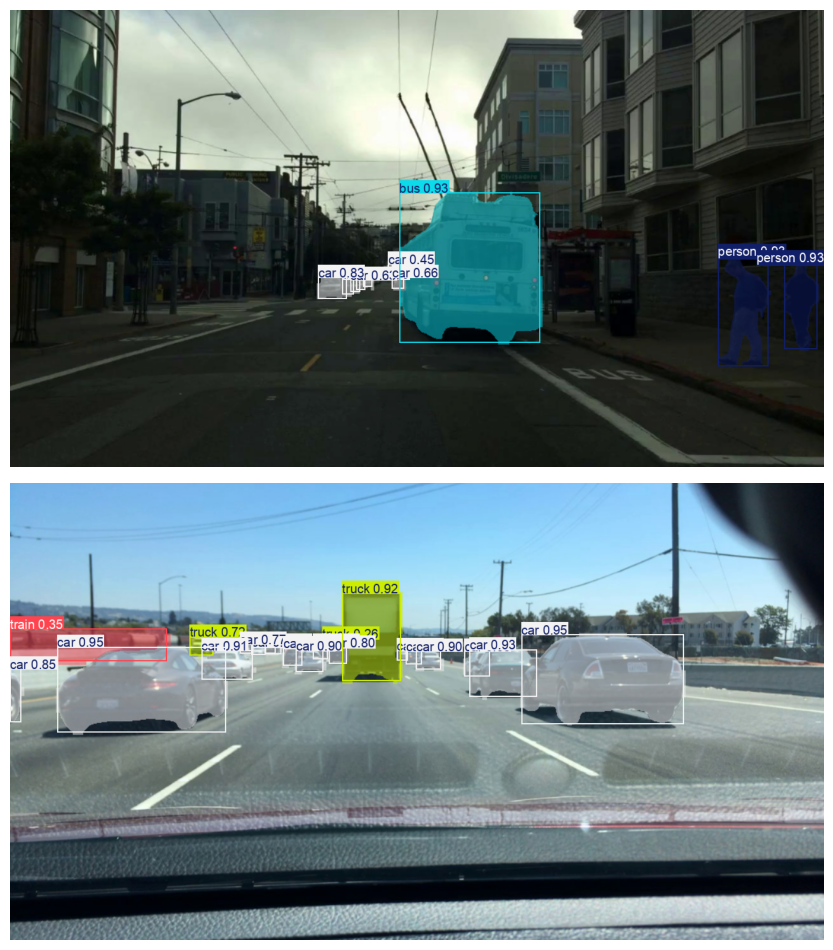

In [ ]:
instance_segmentation(val_image_paths)

### **Internet Images**

In [ ]:
list_urls = [
    "https://preview.redd.it/like-ten-police-cars-are-flying-through-noe-castro-and-24th-v0-0yfhdrke0ele1.jpg?width=4032&format=pjpg&auto=webp&s=818276c935e5e8a5d0952b6a48980966c035d33b",
    "https://www.sfmta.com/files/teaser-images/2017/08/IMG_2848.JPG",
    "https://i.ytimg.com/vi/b_3iEP8ONJs/maxresdefault.jpg?sqp=-oaymwEmCIAKENAF8quKqQMa8AEB-AH-CYAC0AWKAgwIABABGHIgTSg_MA8=&rs=AOn4CLAd7Wi_ABN2UOooQ4i17z6UZgreyw",
    "https://ww2.kqed.org/app/uploads/sites/10/2019/10/10152019_sf_better-market-street2-qut.jpg",
    "https://static.ffx.io/images/$width_620%2C$height_349/t_crop_fill/q_86%2Cf_auto/a60615b1e07448f6c56adefd8fe5d9d026fd99f8",
    "https://www.transurban.com/content/dam/transurban/news/motorcycle-on-the-road-1200x500.jpg",
]

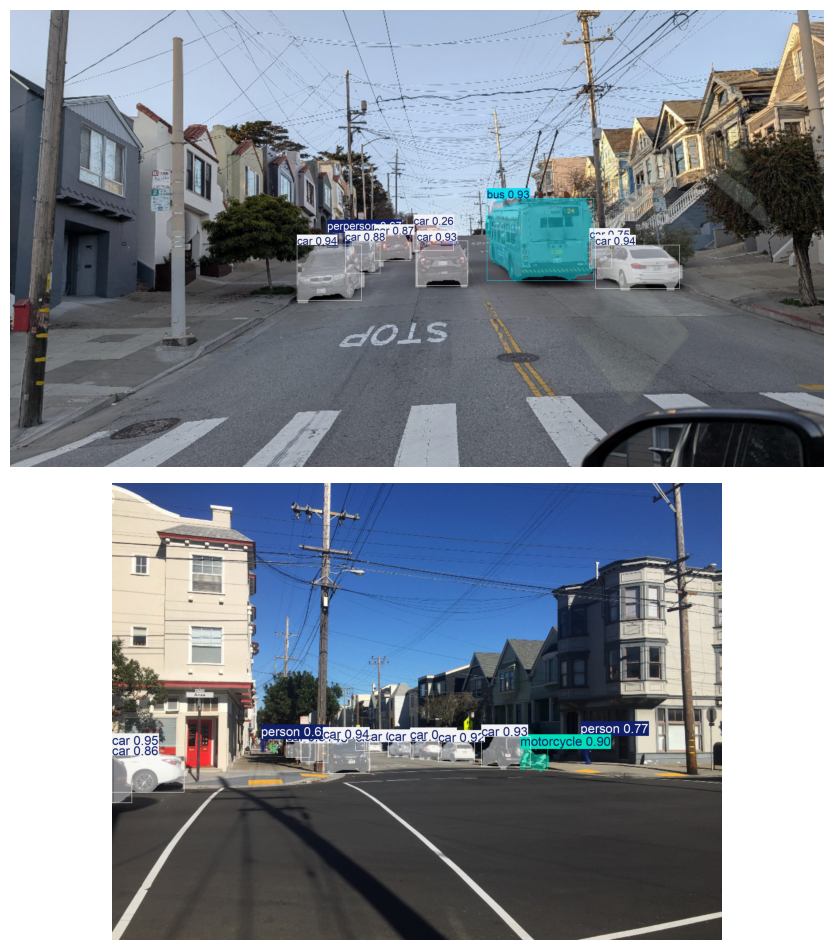

In [ ]:
instance_segmentation(list_urls[:2], random=False, font_size=55)

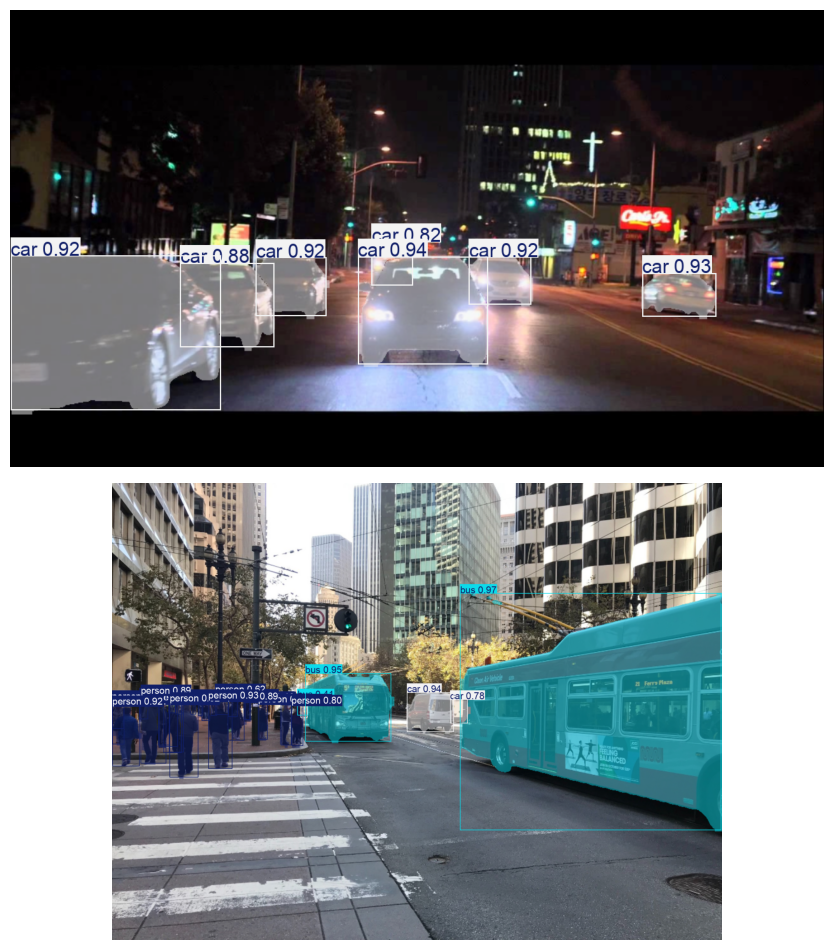

In [ ]:
instance_segmentation(
    list_urls[2:4], random=False, font_size=30, save=True,
    path_save="InstanceSegmentation_YOLO11m_BDD100K_2.png"
)

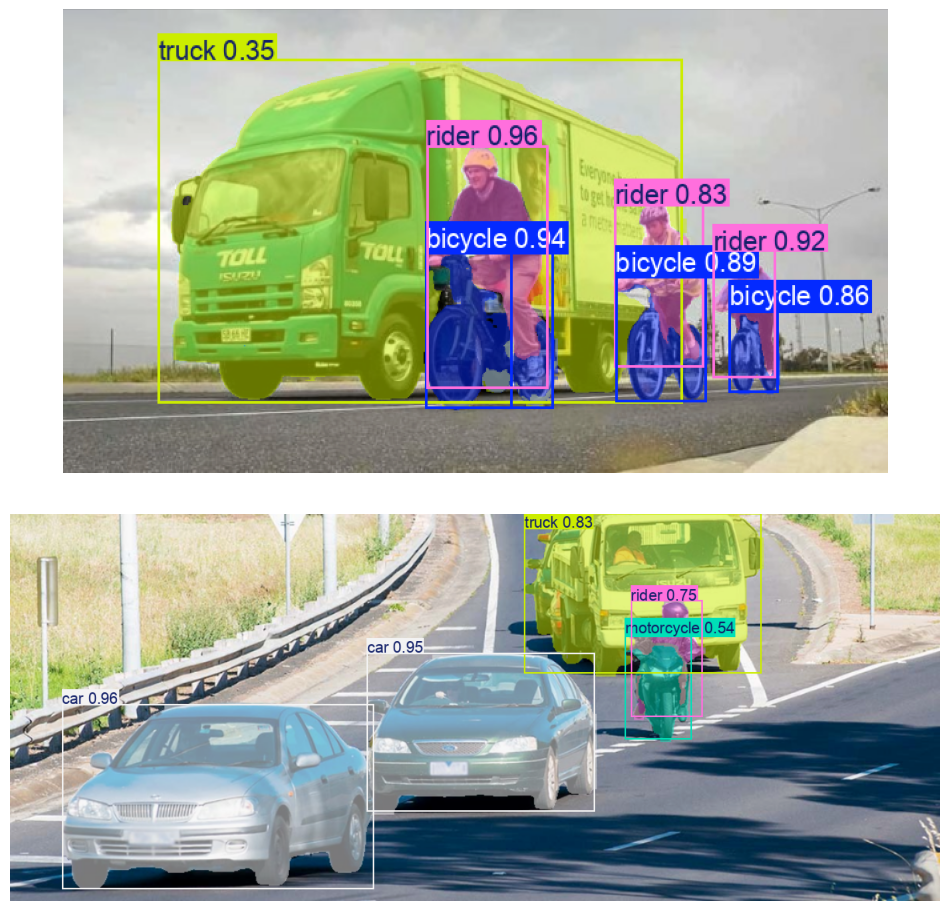

In [ ]:
instance_segmentation(list_urls[4:], random=False)

### **Video Inference**

The video used for inference is available on YouTube at the [following link](https://www.youtube.com/watch?v=PHC7AeFQp7g). To speed up the process, only the first **30 seconds** of the video are used for demonstration.

In [5]:
video_urls = [
    "/content/drive/MyDrive/Videos/BDD100K.mp4",
]

In [6]:
# Function for video inference
def video_segmentation(video, video_path):
  results = model.predict(
      source=video,
      imgsz=imgsz,
      line_width=2,
      stream=False,
      stream_buffer=False,
      vid_stride=1,
      save=True,
      save_frames=False,
      verbose=False
  )

  # Convert the resulting video from AVI to MP4 format
  filename = os.path.basename(video).split(".")[0]
  result_path = os.path.join("/content/runs/segment/predict", f"{filename}.avi")
  !ffmpeg -i $result_path $video_path -loglevel quiet -y

  # Clean up temporary files generated during inference
  !rm -r /content/runs/
  clear_output(wait=False)

  # Extract video properties (width and height) for display
  cap = cv2.VideoCapture(video_path)
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
  cap.release()

  # Display the processed video
  if width > 960:
    height *= 960 / width
    width *= 960 / width

  display(Video(video_path, embed=True, width=width, height=height))

In [7]:
video_segmentation(video_urls[0], "InstanceSegmentation_YOLO11m_BDD100K.mp4")

## **Conclusion**

The **YOLO11m-seg** model, fine-tuned with the **BDD100K** dataset, achieved a $\text{mAP}^{\text{mask}}_{50}$ of **0.464** and a $\text{mAP}^{\text{mask}}_{50-95}$ of **0.266** on the validation set. At first glance, these results might seem average or even low. However, it is important to note that the model is excellent, as this fine-tuning surpasses the best reported model, **Mask Transfiner**, which, according to [Papers With Code](https://paperswithcode.com/sota/instance-segmentation-on-bdd100k-val), only reached a $\text{mAP}^{\text{mask}}_{50-95}$ of **0.236** on the validation set. Moreover, the dataset is highly complex, containing very small and/or partially occluded instances; in other cases, the model demonstrated outstanding performance, as observed during inference.

Regarding class performance, the worst results were obtained for the `train` class, for which both the bounding box precision and recall are zero, and the segmentation precision and recall are nearly zero. This is evident from the validation set inference: in the last example image containing an instance of the `train` class, the model barely segmented part of it. An analysis of all validation images with `train` instances which total only 7 compared with the ground truth shows that the model correctly segments only 1 instance (the one shown in the example). Additionally, 2 instances of the `train` class are misannotated, as they belong to other classes. Therefore, not only does the **BDD100K** dataset have very few examples of the `train` class, but there are also annotation errors. This explains the poor performance of the model on this class, which affects not only instance segmentation but also other tasks such as semantic segmentation, as reported in the [official article](https://arxiv.org/pdf/1805.04687), where an **IoU of 0** was achieved for this class even in the training set.

Thus, to achieve better results, it is necessary not only to use larger, higher-performing models, such as **YOLO11l-seg** or **YOLO11x-seg** (which cannot be fine-tuned using Colab's free GPU), but also to increase the number of images with instances of the minority classes especially the `train` class and to correct annotation errors. Despite these limitations, the fine-tuning of the **YOLO11m-seg** model has delivered excellent results in instance segmentation on the **BDD100K** dataset, even surpassing the best model reported to date. 